In [1]:
# Matlab plots inline
%matplotlib inline

# Auto reload external files after changes
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import scipy as sp
import cv2
import matplotlib.pyplot as plt

from image_set import ImgSet
from image_process import ZernikeProc
from image_process import ResizeProc
import zernike as zn

Loading SHTOOLS documentation


In [3]:
ant_set = ImgSet(name='trees_hr', data_folder='../data/world_images', force_cache=True)
ant_set.M.shape

Loading cache file: ../data/world_images/trees_hr.npz


(37440, 40401)

In [4]:
def cart2polar(x, y):
    phi = np.sqrt(x**2 + y**2)
    theta = np.arctan2(y, x)
    return theta, phi

def wrap_images(M, h, w, order=1):
    
    M_wrapped = np.empty([h*2 * h*2, M.shape[1]], dtype='uint8')
    
    x_range = np.linspace (-1, 1, h*2) # We make the radius of our plot the same as the height of current images.
    xx, yy = np.meshgrid(x_range, x_range)
    theta, phi = cart2polar(xx, yy)
    theta = (theta / np.max(theta) + 1) * (w-1)/2
    phi = phi * (h-1)
    coords = np.vstack((theta.flatten(), phi.flatten()))

    for i, m in enumerate(M.T):
        image = m.reshape([h, w])
        I_wrapped = sp.ndimage.map_coordinates(input=image.T,
                                               coordinates=coords,
                                               output=M_wrapped[:,i],
                                               order=order)
        #M_wrapped[:, i] = I_wrapped
        
    return M_wrapped

In [5]:
#M_wrapped = wrap_images(ant_set.M,
#                        ant_set.h,
#                        ant_set.w,
#                        order=1)
#ant_set_w = ImgSet(name='trees_hr_w', M=M_wrapped, w=ant_set.h*2, h=ant_set.h*2)
#ant_set_w.save()

In [6]:
ant_set_w = ImgSet(name='trees_hr_w')
ant_w_processed = ZernikeProc(ant_set_w)

Loading cache file: data/trees_hr_w.npz
loading from matrix
Loading cache file: data/trees_hr_w_zernikem.npz


In [7]:
def random_direction(M):
    """Takes a 3d array of images and returns new 3d array where each image is randomly rolled on x axis."""
    rows, cols, images = np.ogrid[:M.shape[0], :M.shape[1], :M.shape[2]]
    
    r = np.random.randint(M.shape[1], size=M.shape[2])
    R = np.tile(r, (M.shape[0],1))
    
    cols = cols - R[:,np.newaxis]
    M_rotated = M[rows, cols, images]
    
    return M_rotated

In [8]:
#A = ant_set.M.reshape(104, 360, -1)
#B = random_direction(A)
#M2 = B.reshape(-1, A.shape[2])
#rotated_set = ImgSet(name='trees_hr_random', M=M2, w=A.shape[1], h=A.shape[0])
#rotated_set.save()

In [9]:
rotated_set = ImgSet(name='trees_hr_random')

Loading cache file: data/trees_hr_random.npz


A check to see whether landscapes are rotated correctly

TODO: we should check if the rotations are uniformly distributed

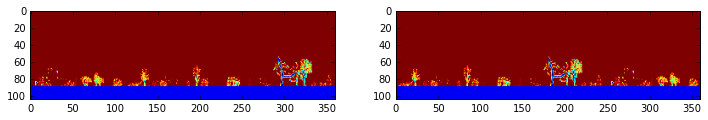

In [10]:
fig, ax = plt.subplots(1,2, figsize=(12,6))
ax[0].imshow(ant_set[5000])
ax[1].imshow(rotated_set[5000])

In [11]:
#M_wrapped = wrap_images(rotated_set.M,
#                        rotated_set.h,
#                        rotated_set.w,
#                        order=1)
#rotated_w_set = ImgSet(name='trees_hr_random_w', M=M_wrapped, w=rotated_set.h*2, h=rotated_set.h*2)
#rotated_w_set.save()

In [12]:
rotated_w_set = ImgSet(name='trees_hr_random_w')

Loading cache file: data/trees_hr_random_w.npz


In [13]:
rotated_w_processed = ZernikeProc(rotated_w_set)

loading from matrix
Loading cache file: data/trees_hr_random_w_zernikem.npz


Check gradients for north facing images with Zernike

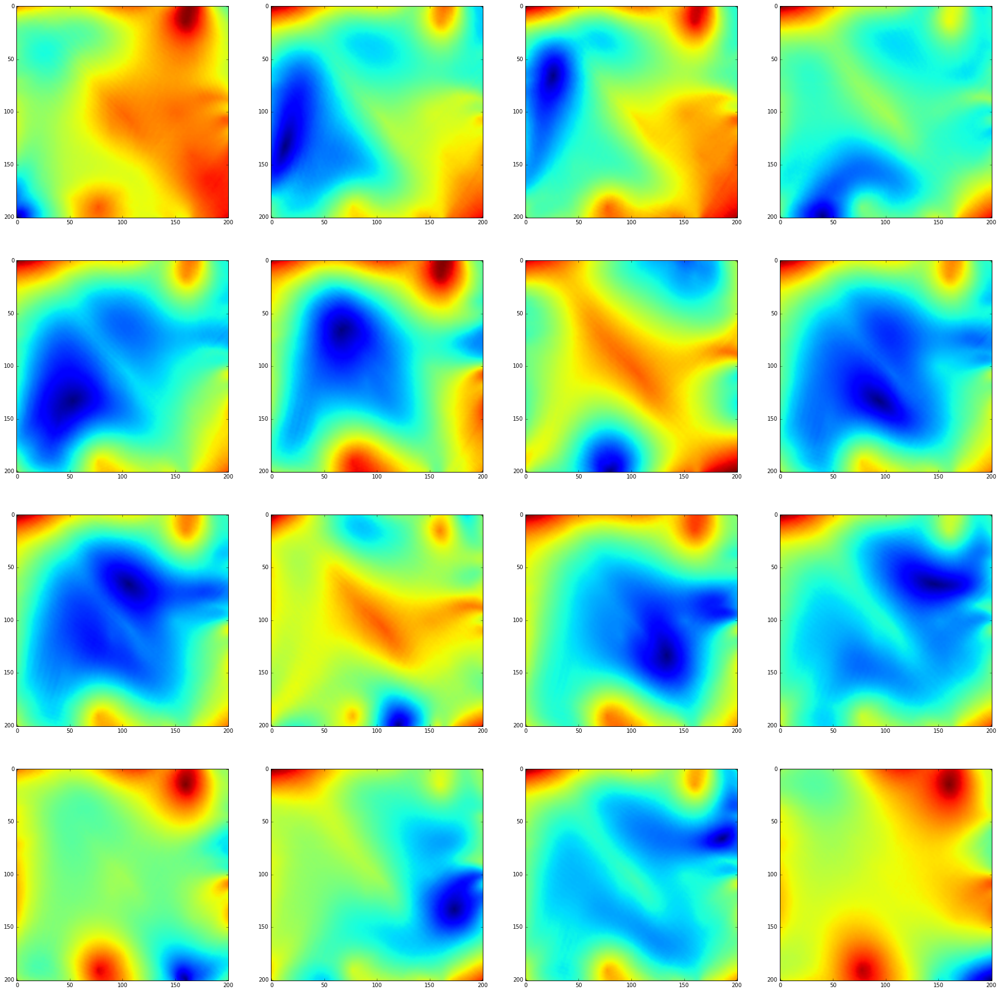

In [14]:
n_mags = zn.num_mags(7)

n = 16
ims_per_row = 201
idxs = np.linspace(0, ims_per_row*(ims_per_row-1), n, dtype='int')

Z = sp.spatial.distance.cdist(ant_w_processed.processed.M[0:n_mags,idxs].T,
                              ant_w_processed.processed.M[0:n_mags,:].T, 'euclidean')

figsize = (32,32)
nrows = 4
ncols = 4

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)

for r in range(nrows):
    for c in range(ncols):
        M = np.rot90(Z[(r*ncols+c),:].reshape(ims_per_row, ims_per_row))
        axes[r][c].imshow(M, vmin=abs(M).min(), vmax=abs(M).max())

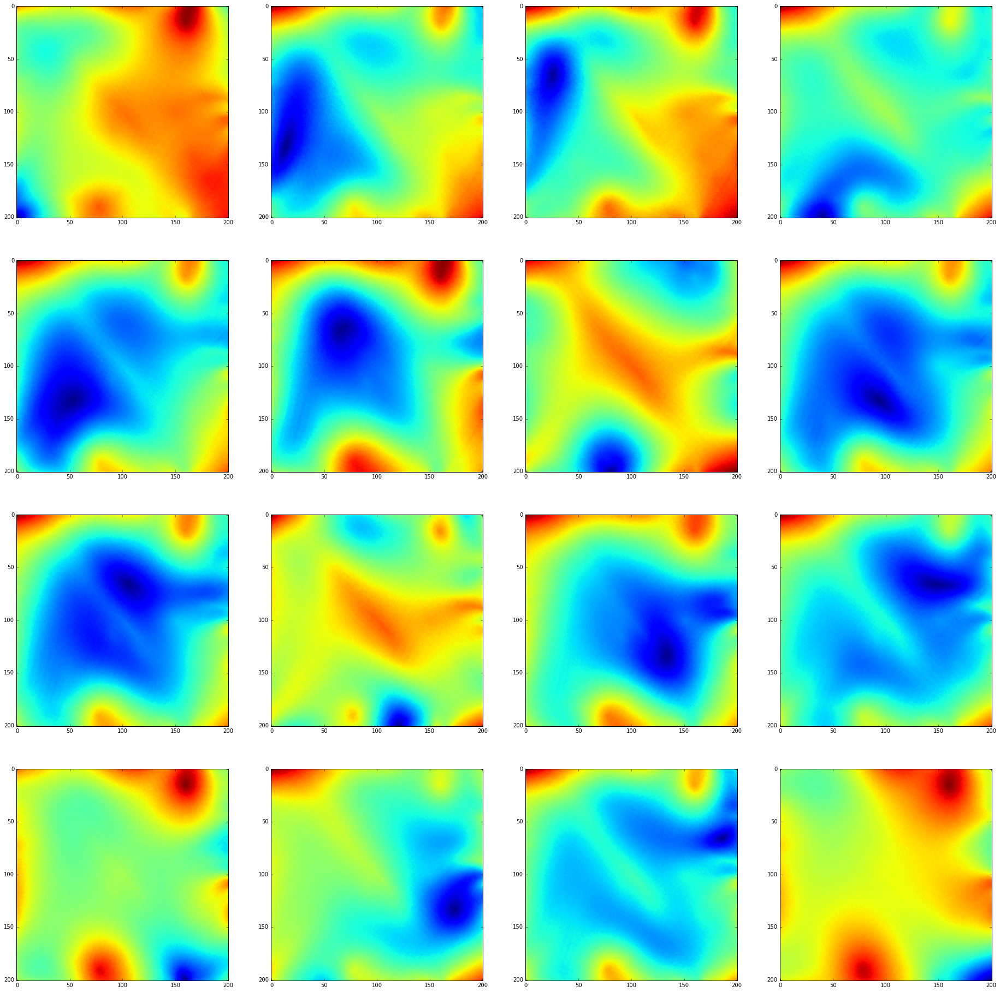

In [15]:
Z2 = sp.spatial.distance.cdist(rotated_w_processed.processed.M[:n_mags,idxs].T,
                               rotated_w_processed.processed.M[:n_mags, :].T, 'euclidean')

figsize = (32,32)
nrows = 4
ncols = 4

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)

for r in range(nrows):
    for c in range(ncols):
        M = np.rot90(Z2[(r*ncols+c),:].reshape(ims_per_row, ims_per_row))
        axes[r][c].imshow(M, vmin=abs(M).min(), vmax=abs(M).max())

In [16]:
def manual_distance(I, image_set):
    """Compare an image to all other images using IDF"""
    
    I_tiled = np.tile(I, (len(image_set),1)).T
    abs_diff = np.abs(image_set.M - I_tiled)
    
    return np.sum(abs_diff, axis=0)

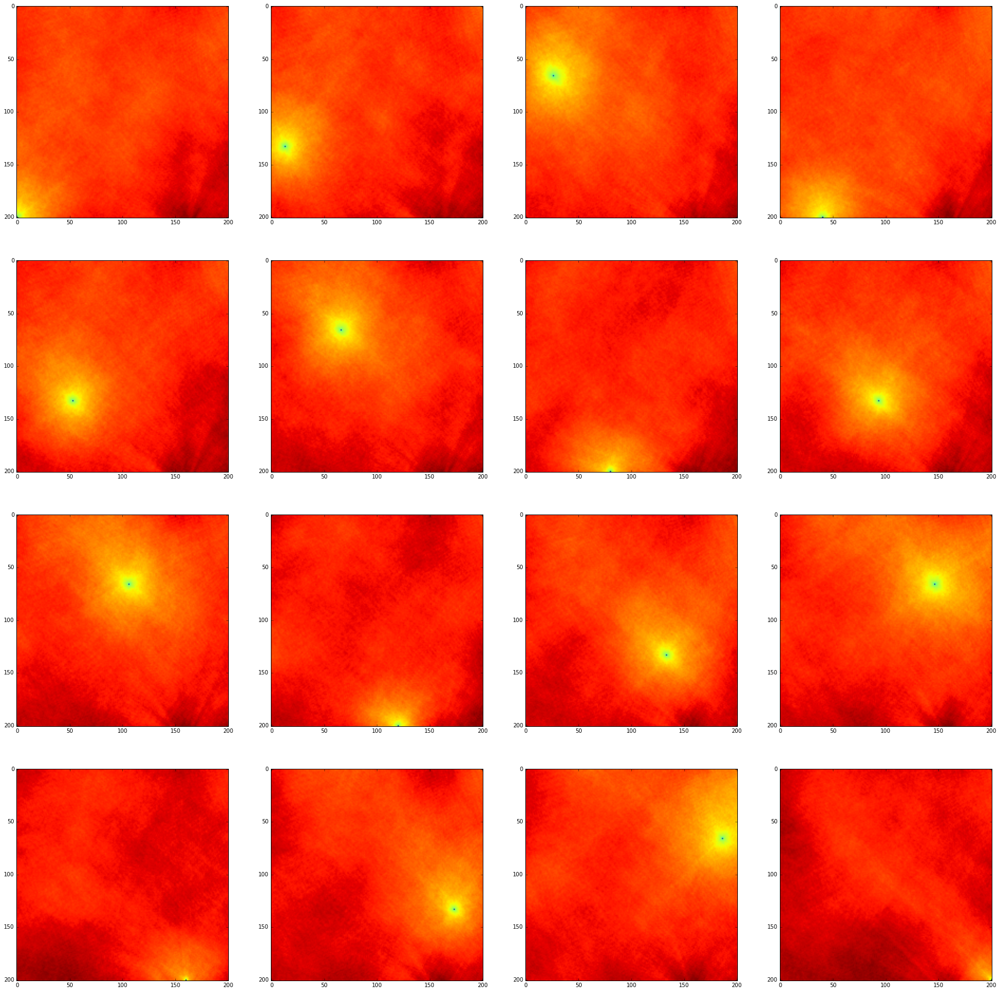

In [17]:
Z3 = np.zeros([n, len(ant_set)])

for i, idx in enumerate(idxs):
    Z3[i] = manual_distance(ant_set[idx].reshape(-1), ant_set)

figsize = (32,32)
nrows = 4
ncols = 4

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)

for r in range(nrows):
    for c in range(ncols):
        M = np.rot90(Z3[(r*ncols+c),:].reshape(ims_per_row, ims_per_row))
        axes[r][c].imshow(M, vmin=abs(M).min(), vmax=abs(M).max())

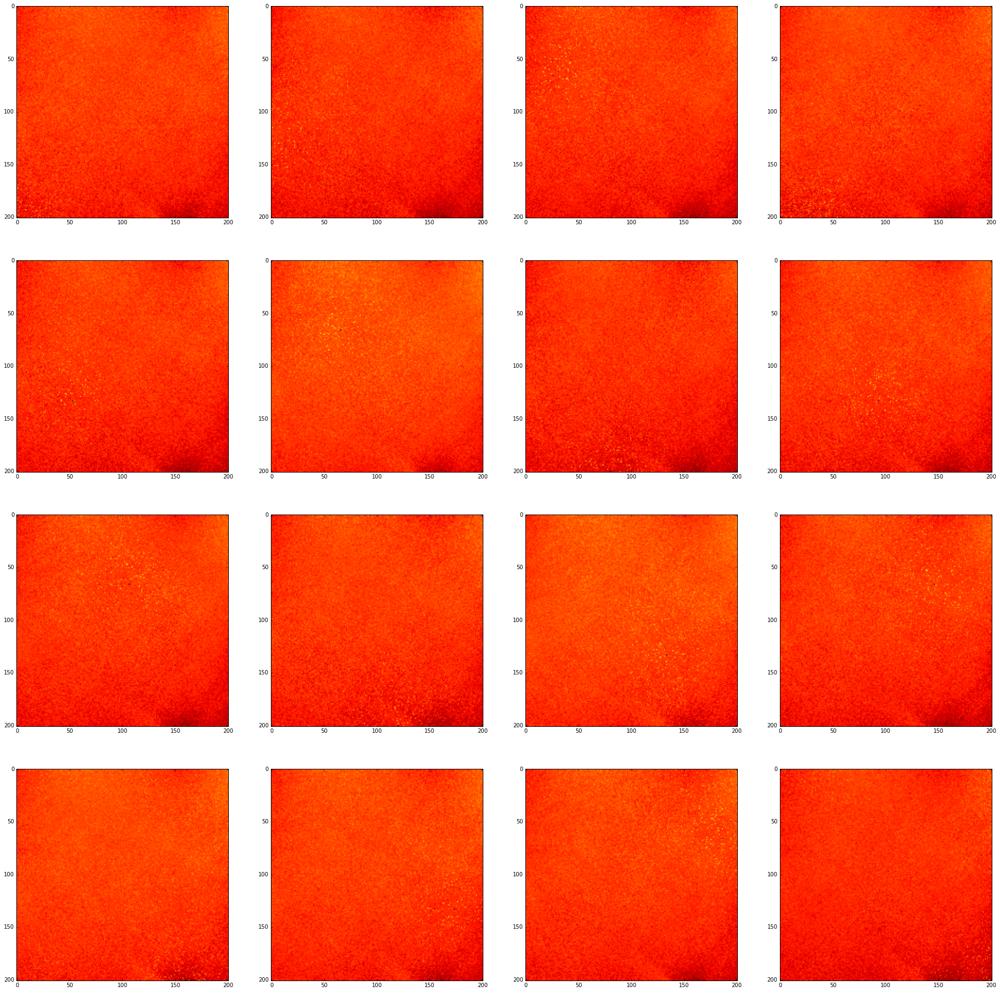

In [18]:
Z4 = np.zeros([n, len(rotated_set)])

for i, idx in enumerate(idxs):
    Z4[i] = manual_distance(rotated_set[idx].reshape(-1), rotated_set)

figsize = (32,32)
nrows = 4
ncols = 4

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)

for r in range(nrows):
    for c in range(ncols):
        M = np.rot90(Z4[(r*ncols+c),:].reshape(ims_per_row, ims_per_row))
        axes[r][c].imshow(M, vmin=abs(M).min(), vmax=abs(M).max())

In [19]:
def gradient_descent(M, step_size=0.5, n_steps=200):

    xs = np.arange(0, M.shape[1])  # cols
    ys = np.arange(0, M.shape[0])  # rows
    
    spl = sp.interpolate.RectBivariateSpline(xs, ys, M.T)  # Transpose this to put in x,y not row, col
    
    XS, YS = np.meshgrid(xs, ys)
    x = XS.astype(np.float64).reshape(-1)
    y = YS.astype(np.float64).reshape(-1)

    for i in range(n_steps):
        dx = spl(x=x, y=y, dx=1, grid=False)
        dy = spl(x=x, y=y, dy=1, grid=False)
        
        v = np.array([dx, dy])
        v_norm = v / np.linalg.norm(v, axis=0)

        x -= step_size * v_norm[0,:]
        np.clip(x, 0, M.shape[1]-1, out=x)

        y -= step_size * v_norm[1,:]
        np.clip(y, 0, M.shape[0]-1, out=y)
        
    return (x, y)

In [20]:
def get_catchment(I, pos_x, pos_y, threshold=2):
    x, y = gradient_descent(I, step_size=2, n_steps=1000)
    
    I2 = I.copy()
    
    distances = sp.spatial.distance.cdist(np.array([pos_x, pos_y]).reshape(1, 2),
                                      np.vstack([x, y]).T,
                                      'euclidean')
    
    indices = (distances <= threshold).astype('uint8') * 255
    catchment = indices.reshape(201,201)

    _, contours, _ = cv2.findContours(catchment, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    # Sort by length of contours
    # TODO: USE HIERARCHY TO INCLUDE CONTOURS WITHIN THIS AREA
    contours = sorted(contours, key=lambda lst: len(lst), reverse=True)
    cv2.drawContours(I2, contours, 0, (0,0,0), 1)
    
    return I2
    

In [176]:
def analyse(Z, idx, threshold=3, n_steps=500, filename=None):
    w_Z = np.sqrt(Z.shape[0])
    
    # The gradient
    M_landscape = Z.copy().reshape(w_Z, w_Z)
    
    # Do a gradient descent
    x, y = gradient_descent(M_landscape, step_size=2, n_steps=n_steps)
    row, col = np.unravel_index(idx, (w_Z, w_Z))
    
    # Find catchment area
    distances = sp.spatial.distance.cdist(np.array([row, col]).reshape(1,2),
                                          np.vstack([y, x]).T,
                                          'euclidean')
    
    indices = distances <= threshold
    M_catchment = indices.reshape(w_Z, w_Z)

    # Plot catchment on the landscape
    # TODO: USE HIERARCHY TO INCLUDE CONTOURS WITHIN THIS AREA
    M_landscape_contour = (M_landscape / np.max(M_landscape) * 255).astype('uint8')

    _, contours, _ = cv2.findContours(M_catchment.astype('uint8')*255,
                                      cv2.RETR_TREE,
                                      cv2.CHAIN_APPROX_SIMPLE)
    # Sort by length of contours
    contours = sorted(contours, key=lambda lst: len(lst), reverse=True)
    cv2.drawContours(image=M_landscape_contour,
                     contours=contours,
                     contourIdx=0,
                     color=(1,0,0),  # WHY IS THIS NOT WORKING?
                     thickness=1)

    fig, ax = plt.subplots(2, 2, figsize=(12,12))
    ax[0][0].imshow(M_landscape, interpolation='None', extent=[-5,5,5,-5])
    ax[0][1].imshow(M_landscape, interpolation='None', extent=[-5,5,5,-5])
    ax[0][1].scatter(x/20-5, y/20-5, marker='.')
    ax[0][1].set_xlim([-5, 5])
    ax[0][1].set_ylim([5, -5])
    ax[1][0].imshow(M_landscape_contour, interpolation='None', extent=[-5,5,5,-5])
    ax[1][1].imshow(distances.reshape([w_Z,w_Z]), interpolation='None', extent=[-5,5,5,-5])
    
    for i in range(2):
        for j in range(2):
            ax[i][j].set_xlabel('metres')
            ax[i][j].set_ylabel('metres')
            
    print np.sum(indices), np.sum(indices)/w_Z**2  # Print out the proportion of area where return is possible
    
    if filename:
        fig.savefig(filename)

    #return fig

In [22]:
def analyse2(Z, idx, threshold=3, n_steps=500):
    w_Z = np.sqrt(Z.shape[0])
    
    # The gradient
    M_landscape = Z.copy().reshape(w_Z, w_Z)
    
    # Do a gradient descent
    x, y = gradient_descent(M_landscape, step_size=2, n_steps=n_steps)
    row, col = np.unravel_index(idx, (w_Z, w_Z))
    
    # Find catchment area
    distances = sp.spatial.distance.cdist(np.array([row, col]).reshape(1,2),
                                          np.vstack([y, x]).T,
                                          'euclidean')
    
    indices = distances <= threshold
    return np.sum(indices)/w_Z**2  # Print out the proportion of area where return is possible

In [29]:
results = []

datasets = [Z, Z2, Z3, Z4]

for i in range(4):
    results.append([])
    
    for j in range(16):
        results[i].append(analyse2(datasets[i][j],
                                   idxs[j],
                                   threshold=10,
                                   n_steps=500
                                  ))
print results

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:5: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:9: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


[[0.077621841043538531, 0.2134848147323086, 0.25217197594118956, 0.059379718323803864, 0.52921957377292639, 0.71646741417291648, 0.2668250785871637, 0.49969060171777924, 0.31541298482710822, 0.20789089378975767, 0.70975965941437091, 0.35934754090245291, 0.22977154030840821, 0.21699957921833618, 0.084379099527239418, 0.19690106680527711], [0.073240761367292892, 0.18747060716318903, 0.2076928788891364, 0.089923516744635029, 0.43607831489319571, 0.59726244399891093, 0.22430137867874558, 0.43714264498403504, 0.28967104774634289, 0.18984678597064428, 0.54204103858815378, 0.26105789460656914, 0.22521719759411896, 0.27061211356154552, 0.10957649563129626, 0.11984851860102473], [0.017351055666938939, 0.073265513229870544, 0.062473701146011237, 0.044256330288854236, 0.062349941833122945, 0.092670973490755176, 0.028712160590084405, 0.078785178584688503, 0.067399321798965378, 0.036806019652978889, 0.085468181480656422, 0.07012202668250786, 0.027029033934803593, 0.078611915546644887, 0.05187990396

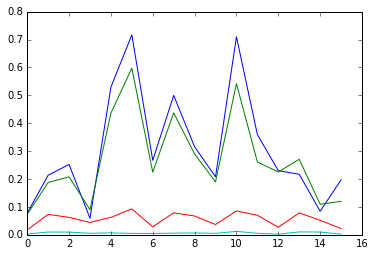

In [32]:
for i in range(4):
    plt.plot(results[i])

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:5: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:9: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:17: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:41: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


28667 0.709561644514


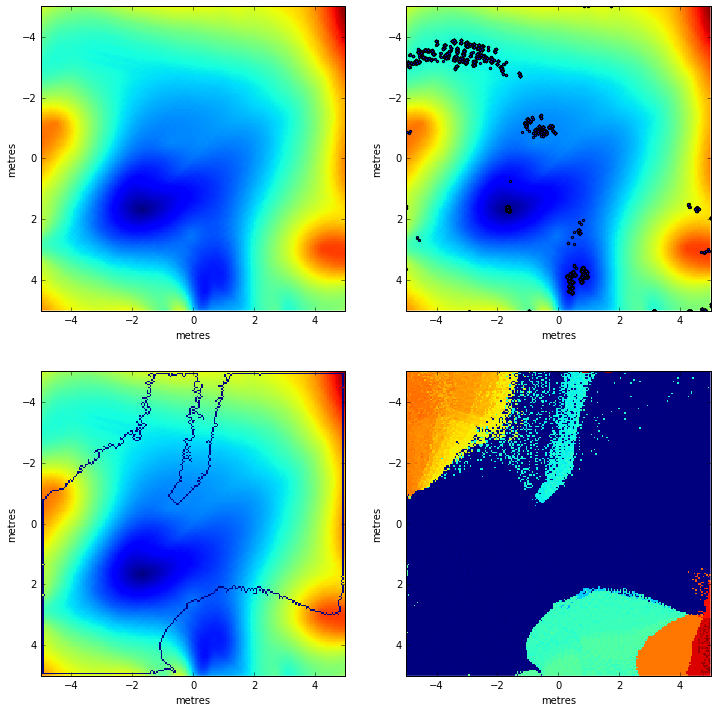

In [177]:
im_to_test = 10
analyse(Z[im_to_test],
        idxs[im_to_test],
        threshold=10,
        n_steps=200,
        filename='freqaligned.pdf')

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:5: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:9: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:17: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:41: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


21654 0.535976832257


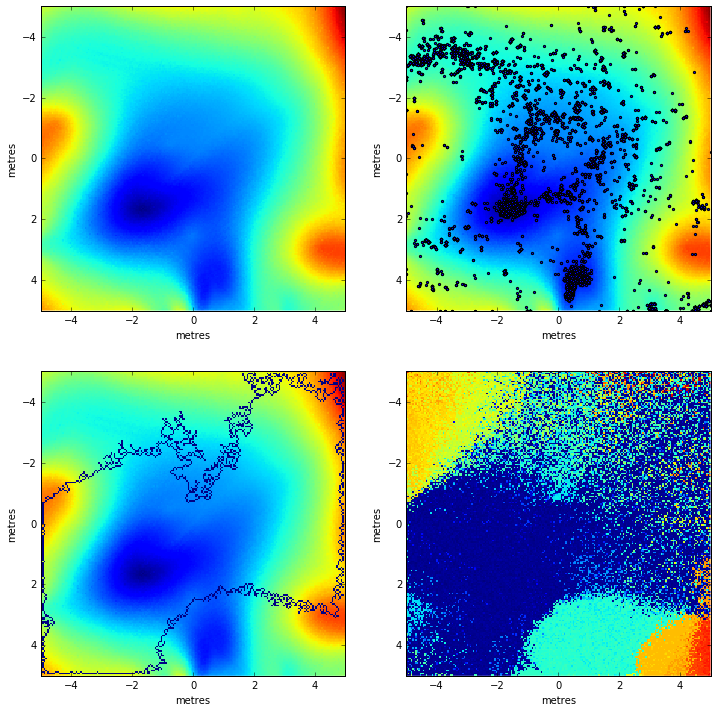

In [178]:
im_to_test = 10
analyse(Z2[im_to_test],
        idxs[im_to_test],
        threshold=10,
        n_steps=200,
        filename='freqrotated.pdf')

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:5: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:9: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:17: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:41: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


3296 0.081582139056


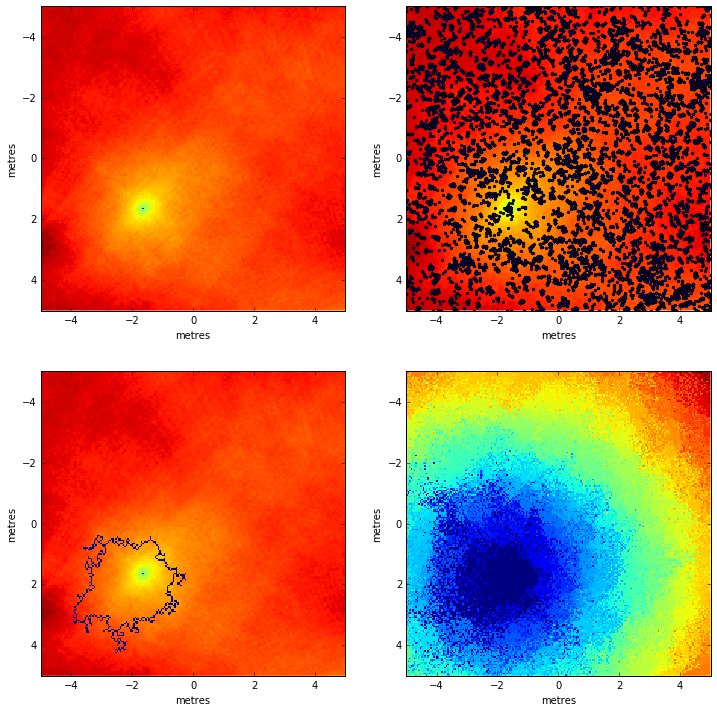

In [179]:
im_to_test = 10
analyse(Z3[im_to_test],
        idxs[im_to_test],
        threshold=10,
        n_steps=200,
        filename='pixaligned.pdf')

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:5: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:9: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:17: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:41: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


486 0.0120294052127


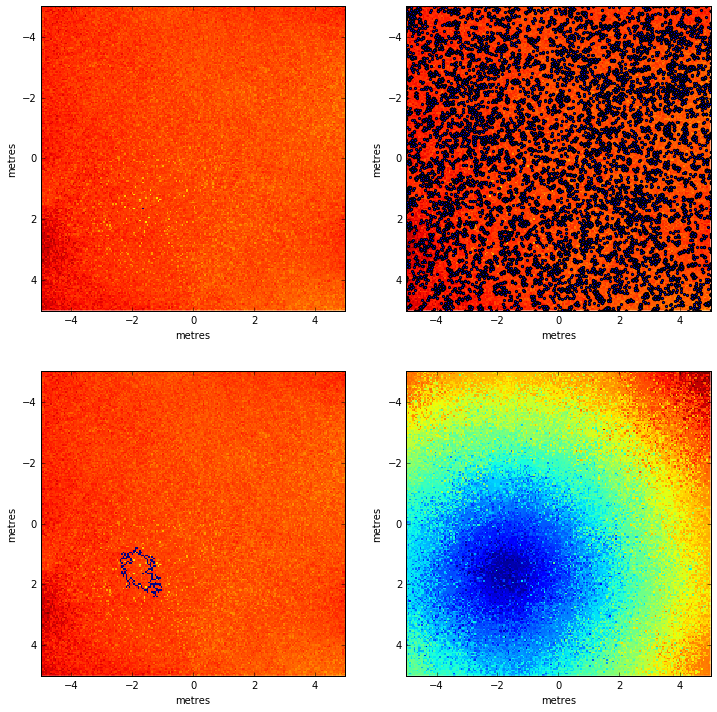

In [180]:
im_to_test = 10
analyse(Z4[im_to_test],
        idxs[im_to_test],
        threshold=10,
        n_steps=200,
        filename='pixrotated.pdf')

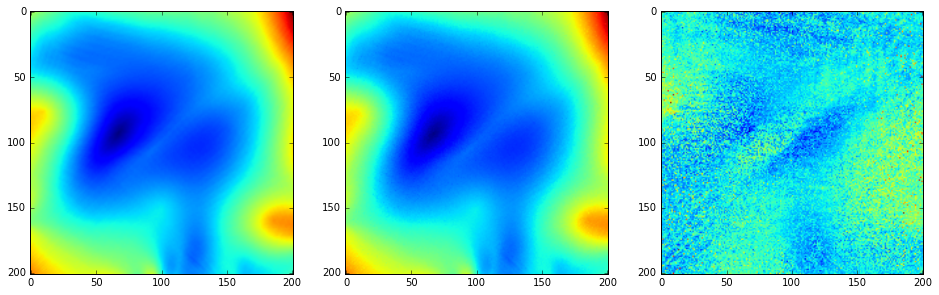

In [35]:
fig, ax = plt.subplots(1, 3, figsize=(16,8))
ax[0].imshow(Z[7,:].reshape(ims_per_row, ims_per_row))
ax[1].imshow(Z2[7,:].reshape(ims_per_row, ims_per_row))
ax[2].imshow((Z[7,:]-Z2[7,:]).reshape(ims_per_row, ims_per_row))

In [36]:
print np.max(Z[7,:]), np.max(Z2[7,:]), np.max(np.abs(Z[7,:]-Z2[7,:]))

249703.065606 249659.103898 8212.47548725


In [37]:
biggest_diff = np.argmax(Z[7,:]-Z2[7,:])

In [38]:
ant_w_processed.processed.M[0:16,biggest_diff]

array([ 2037811.93360147,    19451.94018816,    31188.08197902,
       -1454508.98930265,    19654.18532139,    18500.0941601 ,
          11013.0558204 ,     8130.18184432, -1032905.12818587,
          80172.66385354,    52208.55040734,    30720.71624756,
          23685.45054066,    16649.56368528,    59422.42998334,
         -27490.22529807])

In [39]:
rotated_w_processed.processed.M[0:16,biggest_diff]

array([ 2038551.68577696,    19087.58209148,    33093.09297652,
       -1454300.41879446,    18514.93229347,    17425.62189391,
           9242.70993766,    10754.41237354, -1034366.22720725,
          78139.52772251,    49925.30494033,    30841.41060923,
          22702.35777144,    24003.51055491,    60968.73234802,
         -28058.6930615 ])

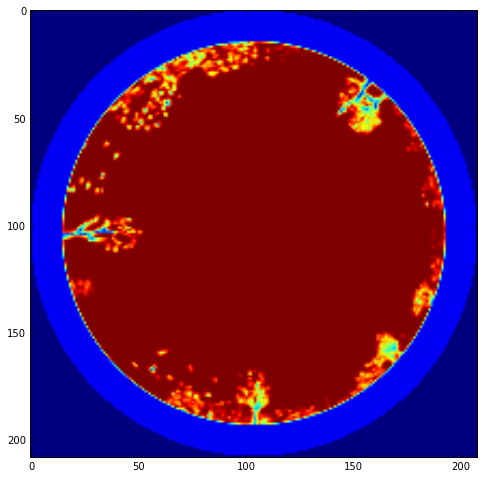

In [40]:
fig, ax = plt.subplots(figsize=(8,8))
ax.imshow(rotated_w_set[biggest_diff])

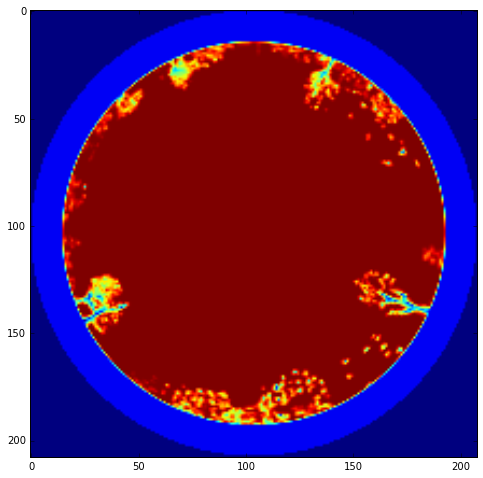

In [41]:
fig, ax = plt.subplots(figsize=(8,8))
ax.imshow(ant_set_w[biggest_diff])

In [42]:
from mahotas.features import zernike_moments

In [43]:
zernike_moments(ant_set_w[biggest_diff], 100)

array([  3.18309886e-01,   2.00521915e-04,   1.86112347e-01,
         2.66133652e-03,   1.94066311e-03,   1.71504008e-03,
         1.60996452e-01,   3.49483572e-04,   8.92943514e-04,
         1.44045916e-03,   4.15662937e-03,   7.51924462e-03,
         5.51767014e-02,   4.46204043e-03,   1.25979436e-03,
         2.43319336e-03,   3.49706319e-03,   1.09979234e-03,
         1.34770350e-02,   1.89879378e-03,   4.83501860e-02,
         3.40658195e-03,   1.86235374e-03,   5.63649991e-03,
         3.53579017e-03])

In [44]:
zernike_moments(rotated_w_set[biggest_diff], 100)

array([  3.18309886e-01,   2.03252632e-04,   1.85997646e-01,
         2.80711538e-03,   1.82868126e-03,   1.62550729e-03,
         1.61165899e-01,   3.41319634e-04,   1.04023924e-03,
         1.41570588e-03,   3.96992784e-03,   7.31714979e-03,
         5.53299033e-02,   4.64666196e-03,   1.59192467e-03,
         2.29740704e-03,   3.28486351e-03,   1.12443466e-03,
         1.31293601e-02,   2.17971892e-03,   4.83960439e-02,
         3.42819896e-03,   1.77076327e-03,   5.43104858e-03,
         3.20948793e-03])

In [45]:
rotated_w_set[biggest_diff].dtype

dtype('uint8')

In [46]:
ant_set_w[biggest_diff].dtype

dtype('uint8')

-0.03256749260353331

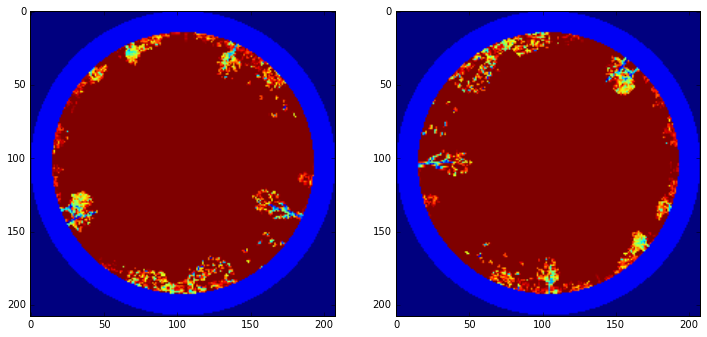

In [47]:
fig, ax = plt.subplots(1, 2, figsize=(12,6))

I_0a = wrap_images(ant_set[biggest_diff].reshape(37440,1),
                         ant_set.h,
                         ant_set.w,
                         order=0).reshape(ant_set.h*2, ant_set.h*2)

I_0b = wrap_images(rotated_set[biggest_diff].reshape(37440,1),
                         rotated_set.h,
                         rotated_set.w,
                         order=0).reshape(rotated_set.h*2, rotated_set.h*2)

ax[0].imshow(I_0a)
ax[1].imshow(I_0b)
np.mean(I_0a) - np.mean(I_0b)

-0.053716715976321439

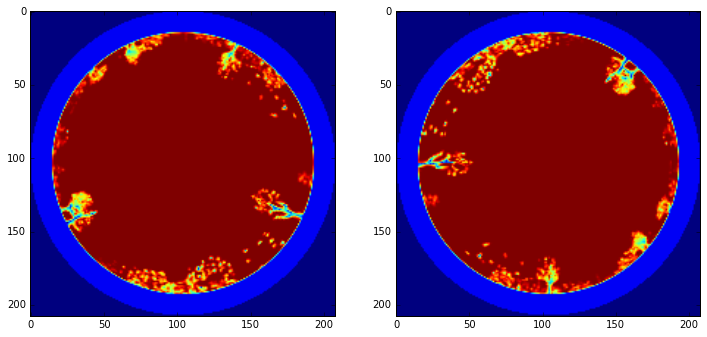

In [48]:
fig, ax = plt.subplots(1, 2, figsize=(12,6))

I_1a = wrap_images(ant_set[biggest_diff].reshape(37440,1),
                         ant_set.h,
                         ant_set.w,
                         order=1).reshape(ant_set.h*2, ant_set.h*2)

I_1b = wrap_images(rotated_set[biggest_diff].reshape(37440,1),
                         rotated_set.h,
                         rotated_set.w,
                         order=1).reshape(rotated_set.h*2, rotated_set.h*2)

ax[0].imshow(I_1a)
ax[1].imshow(I_1b)
np.mean(I_1a) - np.mean(I_1b)

-0.043361686390539944

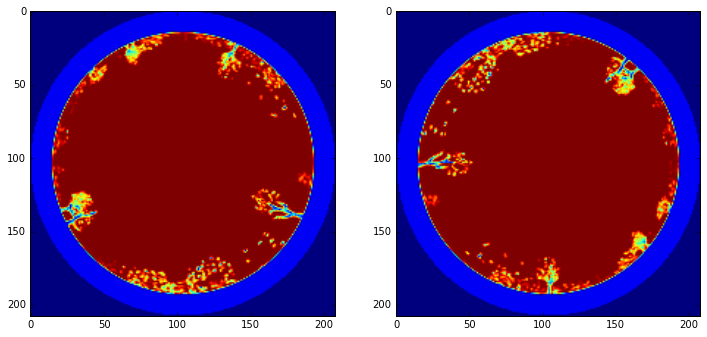

In [49]:
fig, ax = plt.subplots(1, 2, figsize=(12,6))

I_2a = wrap_images(ant_set[biggest_diff].reshape(37440,1),
                         ant_set.h,
                         ant_set.w,
                         order=2).reshape(ant_set.h*2, ant_set.h*2)

I_2b = wrap_images(rotated_set[biggest_diff].reshape(37440,1),
                         rotated_set.h,
                         rotated_set.w,
                         order=2).reshape(rotated_set.h*2, rotated_set.h*2)

ax[0].imshow(I_2a)
ax[1].imshow(I_2b)
np.mean(I_2a) - np.mean(I_2b)

-0.043269230769226397

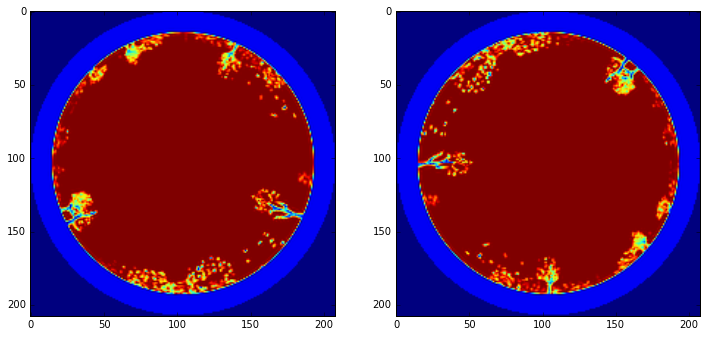

In [50]:
fig, ax = plt.subplots(1, 2, figsize=(12,6))

I_3a = wrap_images(ant_set[biggest_diff].reshape(37440,1),
                         ant_set.h,
                         ant_set.w,
                         order=3).reshape(ant_set.h*2, ant_set.h*2)

I_3b = wrap_images(rotated_set[biggest_diff].reshape(37440,1),
                         rotated_set.h,
                         rotated_set.w,
                         order=3).reshape(rotated_set.h*2, rotated_set.h*2)

ax[0].imshow(I_3a)
ax[1].imshow(I_3b)
np.mean(I_3a) - np.mean(I_3b)

-0.043893306213021788

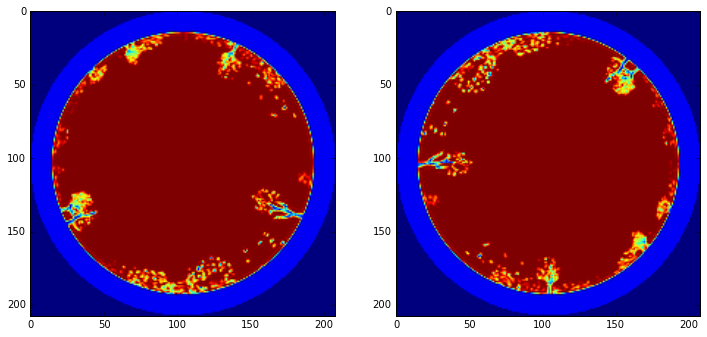

In [51]:
fig, ax = plt.subplots(1, 2, figsize=(12,6))

I_4a = wrap_images(ant_set[biggest_diff].reshape(37440,1),
                         ant_set.h,
                         ant_set.w,
                         order=4).reshape(ant_set.h*2, ant_set.h*2)

I_4b = wrap_images(rotated_set[biggest_diff].reshape(37440,1),
                         rotated_set.h,
                         rotated_set.w,
                         order=4).reshape(rotated_set.h*2, rotated_set.h*2)

ax[0].imshow(I_4a)
ax[1].imshow(I_4b)
np.mean(I_4a) - np.mean(I_4b)

-0.042853180473372277

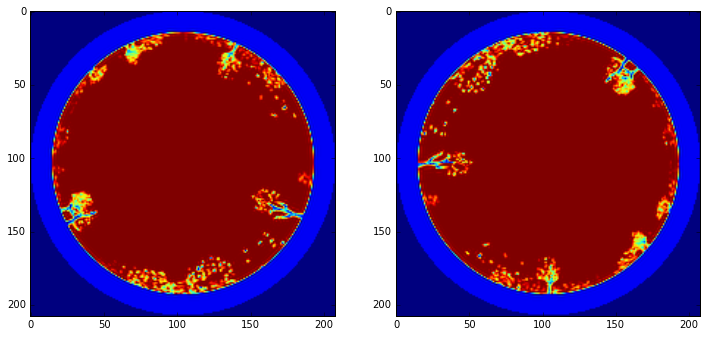

In [52]:
fig, ax = plt.subplots(1, 2, figsize=(12,6))

I_5a = wrap_images(ant_set[biggest_diff].reshape(37440,1),
                         ant_set.h,
                         ant_set.w,
                         order=5).reshape(ant_set.h*2, ant_set.h*2)

I_5b = wrap_images(rotated_set[biggest_diff].reshape(37440,1),
                         rotated_set.h,
                         rotated_set.w,
                         order=5).reshape(rotated_set.h*2, rotated_set.h*2)

ax[0].imshow(I_5a)
ax[1].imshow(I_5b)
np.mean(I_5a) - np.mean(I_5b)

In [53]:
np.mean(I_5a)

147.66057230029585

In [54]:
x_points = np.sin(np.linspace(1.5 * np.pi, 2.0 * np.pi, 20)) + 1
x_points /= np.max(x_points)

y_points = np.cos(np.linspace(1.5 * np.pi, 2.0 * np.pi, 20))
y_points /= np.max(y_points)

In [55]:
banana_x = 40 + (120.0 * x_points).astype('uint32')
banana_y = 30 + (140.0 * y_points).astype('uint32')

In [56]:
nest_x = np.array([160, 160, 170])
nest_y = np.array([160, 180, 170])

(40.0, 180.0, 20.0, 180.0)

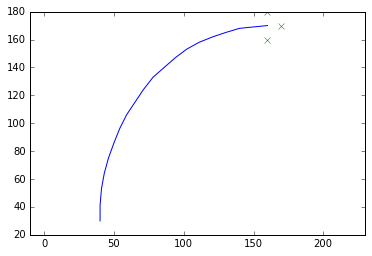

In [57]:
plt.plot(banana_x, banana_y)
plt.plot(nest_x, nest_y, 'x')
plt.axis('equal')

In [58]:
banana = np.array([201-np.hstack([banana_y, nest_y]),
                   np.hstack([banana_x, nest_x])])

banana_idxs = np.ravel_multi_index(banana, (201, 201))
banana_idxs

array([34411, 32200, 29789, 27580, 25372, 23165, 21159, 19154, 17351,
       15548, 13746, 12347, 10948,  9750,  8754,  7960,  7366,  6773,
        6582,  6391,  8401,  4381,  6401])

In [59]:
Z_banana = np.min(sp.spatial.distance.cdist(ant_w_processed.processed.M[0:n_mags,banana_idxs].T,
                                            ant_w_processed.processed.M[0:n_mags,:].T, 'euclidean'), axis=0)

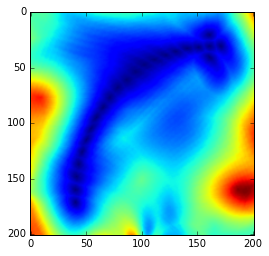

In [61]:
plt.imshow(Z_banana.reshape(201,201))

In [62]:
banana

array([[171, 160, 148, 137, 126, 115, 105,  95,  86,  77,  68,  61,  54,
         48,  43,  39,  36,  33,  32,  31,  41,  21,  31],
       [ 40,  40,  41,  43,  46,  50,  54,  59,  65,  71,  78,  86,  94,
        102, 111, 121, 130, 140, 150, 160, 160, 160, 170]])

In [63]:
start_x = 160
start_y = 30

In [64]:
def single_gradient_descent(M, x, y, step_size=0.5, n_steps=200):

    xs = np.arange(0, M.shape[1])  # cols
    ys = np.arange(0, M.shape[0])  # rows
    
    spl = sp.interpolate.RectBivariateSpline(xs, ys, M.T)  # Transpose this to put in x,y not row, col

    log = np.zeros([n_steps + 1, 2])
    log[0,:] = [x,y]
    
    for i in range(n_steps):
        dx = spl(x=x, y=y, dx=1, grid=False)
        dy = spl(x=x, y=y, dy=1, grid=False)
        
        v = np.array([dx, dy])
        v_norm = v / np.linalg.norm(v, axis=0)

        x -= step_size * v_norm[0]
        x = np.clip(x, 0, M.shape[1]-1)

        y -= step_size * v_norm[1]
        y = np.clip(y, 0, M.shape[0]-1)
        log[i+1,:] = [x,y]
        
    return log

In [217]:
n_steps = 500

offsets = np.random.normal(scale=15,
                           size=(20,2)).astype('int')

home_path = np.zeros([n_steps+1, 2, 20])
for i in range(20):
    home_path[:,:,i] = single_gradient_descent(Z_banana.reshape(201,201),
                                               start_x+offsets[i,0],
                                               201-start_y+offsets[i,1],
                                               n_steps=n_steps)

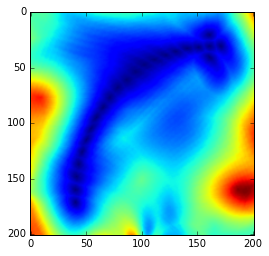

In [218]:
plt.imshow(Z_banana.reshape(201,201))

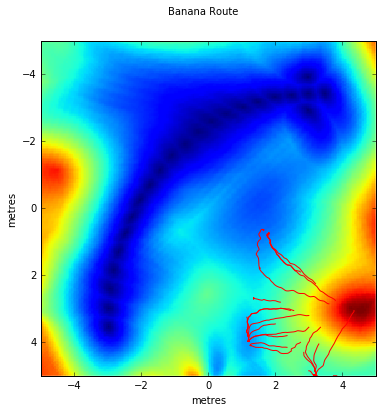

In [164]:
fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(Z_banana.reshape(201,201), interpolation='none', extent=[-5,5,5,-5])
ax.plot(home_path[:,0,:] / 20 - 5, home_path[:,1,:] / 20 - 5, 'r')
ax.set_xlim([-5, 5])
ax.set_ylim([5, -5])
ax.set_xlabel('metres')
ax.set_ylabel('metres')
fig.suptitle('Banana Route')
fig.savefig('banana.pdf')

I think this depends quite a lot on the landscape... could try to repeat using all 4 rotations + flipped

In [68]:
headings = np.rad2deg(np.hstack([np.arctan2(np.diff(banana_x), np.diff(banana_y)), np.pi/2])).astype('int')

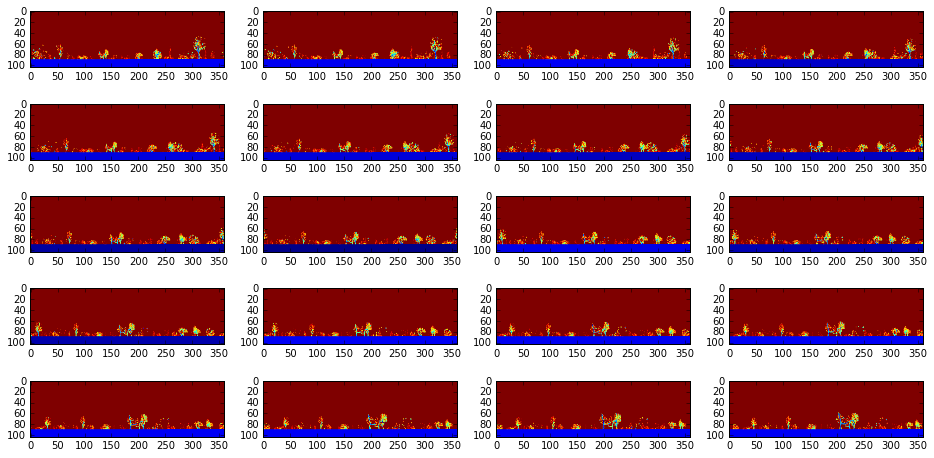

In [69]:
fig, ax = plt.subplots(5,4, figsize=(16,8))

memory = np.zeros([ant_set.w * ant_set.h, 20])
    
for i in range(20):
    memory[:,i] = np.roll(ant_set[banana_idxs[i]], 180+headings[i]).reshape(-1)
    ax[i/4][i%4].imshow(np.roll(ant_set[banana_idxs[i]], 180+headings[i]))

Now get the angle that images were taken at

In [70]:
# dirty nasty ugly code

angles = np.zeros([21,21])

indices = range(0, 201, 10)

for i in range(len(indices)):
    print i
    for j in range(len(indices)):
        idx = np.ravel_multi_index([indices[i],indices[j]], (201, 201))
        
        smallest = np.inf
        for k in range(0, 360):
            for mem in memory.T:
                diff = np.sum(np.abs(np.roll(ant_set[idx],k) - mem.reshape(ant_set.h, ant_set.w)))
                if diff < smallest:
                    smallest = diff
                    angle = k
                    
        angles[i,j] = angle
        

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


In [71]:
U = np.cos(np.deg2rad(angles+180))
V = np.sin(np.deg2rad(angles+180))

In [141]:
np.linspace(-20,20,21)

array([-20., -18., -16., -14., -12., -10.,  -8.,  -6.,  -4.,  -2.,   0.,
         2.,   4.,   6.,   8.,  10.,  12.,  14.,  16.,  18.,  20.])

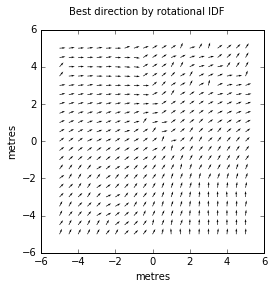

In [150]:
dx = np.linspace(-5,5,21)
X,Y = np.meshgrid(dx,dx)

fig, ax = plt.subplots()
ax.quiver(X, Y, U, V)
ax.set_aspect('equal')
ax.set_xlabel('metres')
ax.set_ylabel('metres')
fig.suptitle('Best direction by rotational IDF')
fig.savefig('RIDF_quiver.pdf')

In [102]:
def manual_distance2(I, M):
    """Compare an image to all other images using IDF"""
    
    I_tiled = np.tile(I, (M.shape[1],1)).T
    abs_diff = np.abs(M - I_tiled)
    
    return np.sum(abs_diff, axis=0)

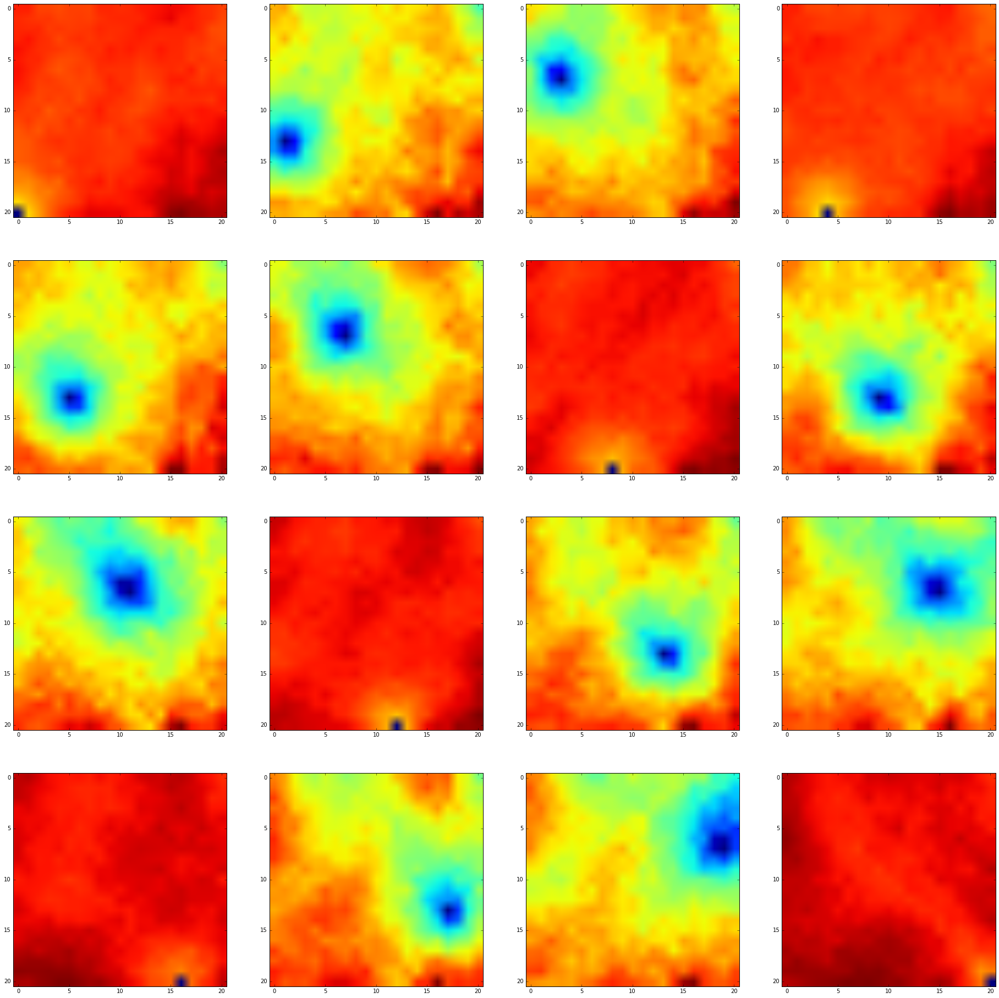

In [181]:
idxs2 = np.linspace(0, 21*(21-1), n, dtype='int')

Z3ds = np.zeros([16, 21**2])

M_small = ant_set.M.reshape(ant_set.M.shape[0], 201, 201)[:,::10,::10].reshape(ant_set.M.shape[0],-1)

for i, idx in enumerate(idxs):
    Z3ds[i] = manual_distance2(ant_set[idx].reshape(-1), M_small)

figsize = (32,32)
nrows = 4
ncols = 4

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)

for r in range(nrows):
    for c in range(ncols):
        M = np.rot90(Z3ds[(r*ncols+c),:].reshape(21, 21))
        axes[r][c].imshow(M, vmin=abs(M).min(), vmax=abs(M).max())

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:5: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:9: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:17: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:41: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


85 0.192743764172


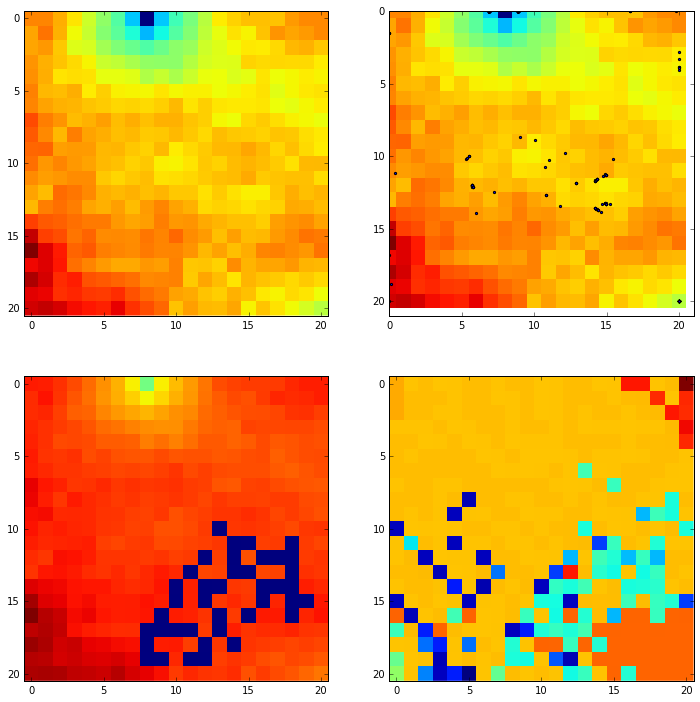

In [115]:
im_to_test = 10

analyse(Z3ds[im_to_test],
        idxs2[im_to_test],
        threshold=10,
        n_steps=200)

In [117]:
idxs2[10]

280

In [122]:
idxs

array([    0,  2680,  5360,  8040, 10720, 13400, 16080, 18760, 21440,
       24120, 26800, 29480, 32160, 34840, 37520, 40200])

In [123]:
idxs2

array([  0,  28,  56,  84, 112, 140, 168, 196, 224, 252, 280, 308, 336,
       364, 392, 420])

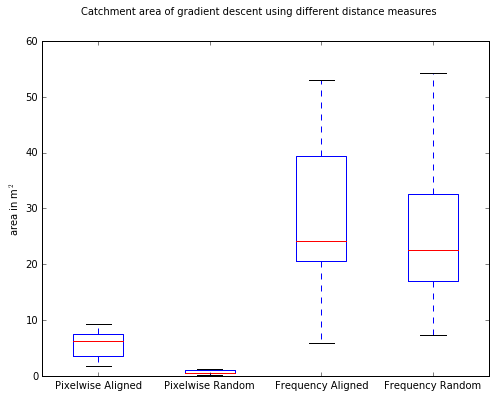

In [190]:
labels = ['Pixelwise Aligned', 'Pixelwise Random','Frequency Aligned', 'Frequency Random']
fig, ax = plt.subplots(figsize=(8,6))
ax.boxplot(np.roll(np.array(results),2,axis=0).T * 100, 0, '', labels=labels)
ax.set_ylabel('area in m$^2$')
fig.suptitle('Catchment area of gradient descent using different distance measures')
fig.savefig('boxplots.pdf')

In [188]:
np.array(results)

array([[ 0.07762184,  0.21348481,  0.25217198,  0.05937972,  0.52921957,
         0.71646741,  0.26682508,  0.4996906 ,  0.31541298,  0.20789089,
         0.70975966,  0.35934754,  0.22977154,  0.21699958,  0.0843791 ,
         0.19690107],
       [ 0.07324076,  0.18747061,  0.20769288,  0.08992352,  0.43607831,
         0.59726244,  0.22430138,  0.43714264,  0.28967105,  0.18984679,
         0.54204104,  0.26105789,  0.2252172 ,  0.27061211,  0.1095765 ,
         0.11984852],
       [ 0.01735106,  0.07326551,  0.0624737 ,  0.04425633,  0.06234994,
         0.09267097,  0.02871216,  0.07878518,  0.06739932,  0.03680602,
         0.08546818,  0.07012203,  0.02702903,  0.07861192,  0.0518799 ,
         0.02230143],
       [ 0.00279696,  0.00987599,  0.00970273,  0.0053464 ,  0.00698003,
         0.00495037,  0.00470285,  0.00581669,  0.00665825,  0.00517314,
         0.01227692,  0.00532165,  0.00235143,  0.01039578,  0.00985124,
         0.00222767]])

In [189]:
np.roll(np.array(results),2,axis=0)

array([[ 0.01735106,  0.07326551,  0.0624737 ,  0.04425633,  0.06234994,
         0.09267097,  0.02871216,  0.07878518,  0.06739932,  0.03680602,
         0.08546818,  0.07012203,  0.02702903,  0.07861192,  0.0518799 ,
         0.02230143],
       [ 0.00279696,  0.00987599,  0.00970273,  0.0053464 ,  0.00698003,
         0.00495037,  0.00470285,  0.00581669,  0.00665825,  0.00517314,
         0.01227692,  0.00532165,  0.00235143,  0.01039578,  0.00985124,
         0.00222767],
       [ 0.07762184,  0.21348481,  0.25217198,  0.05937972,  0.52921957,
         0.71646741,  0.26682508,  0.4996906 ,  0.31541298,  0.20789089,
         0.70975966,  0.35934754,  0.22977154,  0.21699958,  0.0843791 ,
         0.19690107],
       [ 0.07324076,  0.18747061,  0.20769288,  0.08992352,  0.43607831,
         0.59726244,  0.22430138,  0.43714264,  0.28967105,  0.18984679,
         0.54204104,  0.26105789,  0.2252172 ,  0.27061211,  0.1095765 ,
         0.11984852]])

In [215]:
n_mags2 = zn.num_mags(8)

Z_banana2 = np.mean(sp.spatial.distance.cdist(ant_w_processed.processed.M[0:n_mags2,banana_idxs].T,
                                              ant_w_processed.processed.M[0:n_mags2,:].T, 'euclidean'), axis=0)

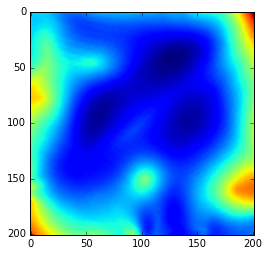

In [216]:
plt.imshow(Z_banana2.reshape(201,201))

In [195]:
n_steps = 500

offsets = np.random.normal(scale=15,
                           size=(20,2)).astype('int')

home_path2 = np.zeros([n_steps+1, 2, 20])
for i in range(20):
    home_path2[:,:,i] = single_gradient_descent(Z_banana2.reshape(201,201),
                                                start_x+offsets[i,0],
                                                201-start_y+offsets[i,1],
                                                n_steps=n_steps)

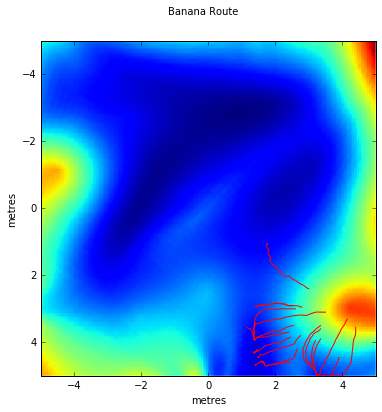

In [196]:
fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(Z_banana2.reshape(201,201), interpolation='none', extent=[-5,5,5,-5])
ax.plot(home_path2[:,0,:] / 20 - 5, home_path2[:,1,:] / 20 - 5, 'r')
ax.set_xlim([-5, 5])
ax.set_ylim([5, -5])
ax.set_xlabel('metres')
ax.set_ylabel('metres')
fig.suptitle('Banana Route')
fig.savefig('banana2.pdf')

In [220]:
np.save(np.array(results)

array([[ 0.07762184,  0.21348481,  0.25217198,  0.05937972,  0.52921957,
         0.71646741,  0.26682508,  0.4996906 ,  0.31541298,  0.20789089,
         0.70975966,  0.35934754,  0.22977154,  0.21699958,  0.0843791 ,
         0.19690107],
       [ 0.07324076,  0.18747061,  0.20769288,  0.08992352,  0.43607831,
         0.59726244,  0.22430138,  0.43714264,  0.28967105,  0.18984679,
         0.54204104,  0.26105789,  0.2252172 ,  0.27061211,  0.1095765 ,
         0.11984852],
       [ 0.01735106,  0.07326551,  0.0624737 ,  0.04425633,  0.06234994,
         0.09267097,  0.02871216,  0.07878518,  0.06739932,  0.03680602,
         0.08546818,  0.07012203,  0.02702903,  0.07861192,  0.0518799 ,
         0.02230143],
       [ 0.00279696,  0.00987599,  0.00970273,  0.0053464 ,  0.00698003,
         0.00495037,  0.00470285,  0.00581669,  0.00665825,  0.00517314,
         0.01227692,  0.00532165,  0.00235143,  0.01039578,  0.00985124,
         0.00222767]])

In [225]:
from scipy import io as sio

In [228]:
sio.savemat('catchment_areas.mat', {'areas': np.array([results])})

In [3]:
plt.imshow(ant_set_w[6])

NameError: name 'ant_set_w' is not defined